## 1. Importing Required Libraries

In [1]:
!pip install xarray netCDF4

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 40.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 42.6 MB/s eta 0:00:00


In [2]:
import xarray as xr
import pandas as pd
import dask

In [7]:
import matplotlib.pyplot as plt

In [14]:
import matplotlib.animation as animation
from IPython.display import HTML

## 2. Loading the Data

In [3]:
# Open the dataset without specifying chunks
ds = xr.open_dataset('/content/drive/MyDrive/Project Learnings/Data/Reanalysis_swsh_3hrly_22_23.nc')

## 2.1 Loading the data in chunks

In [4]:
# Rechunk after loading
ds = ds.chunk({'valid_time': 240, 'latitude': 90, 'longitude': 180})

In [5]:
ds

<xarray.Dataset> Size: 6GB
Dimensions:     (valid_time: 5840, latitude: 361, longitude: 720)
Coordinates:
    number      int64 8B ...
  * valid_time  (valid_time) datetime64[ns] 47kB 2022-01-01 ... 2023-12-31T21...
  * latitude    (latitude) float64 3kB 90.0 89.5 89.0 88.5 ... -89.0 -89.5 -90.0
  * longitude   (longitude) float64 6kB 0.0 0.5 1.0 1.5 ... 358.5 359.0 359.5
    expver      (valid_time) <U4 93kB dask.array<chunksize=(240,), meta=np.ndarray>
Data variables:
    swh         (valid_time, latitude, longitude) float32 6GB dask.array<chunksize=(240, 90, 180), meta=np.ndarray>
Attributes:
    GRIB_centre:             ecmf
    GRIB_centreDescription:  European Centre for Medium-Range Weather Forecasts
    GRIB_subCentre:          0
    Conventions:             CF-1.7
    institution:             European Centre for Medium-Range Weather Forecasts
    history:                 2024-11-07T06:55 GRIB to CDM+CF via cfgrib-0.9.1...

In [6]:
# Summary of all variables in the dataset
print(ds.info())

xarray.Dataset {
dimensions:
	valid_time = 5840 ;
	latitude = 361 ;
	longitude = 720 ;

variables:
	int64 number() ;
		number:long_name = ensemble member numerical id ;
		number:units = 1 ;
		number:standard_name = realization ;
	datetime64[ns] valid_time(valid_time) ;
		valid_time:long_name = time ;
		valid_time:standard_name = time ;
	float64 latitude(latitude) ;
		latitude:units = degrees_north ;
		latitude:standard_name = latitude ;
		latitude:long_name = latitude ;
		latitude:stored_direction = decreasing ;
	float64 longitude(longitude) ;
		longitude:units = degrees_east ;
		longitude:standard_name = longitude ;
		longitude:long_name = longitude ;
	<U4 expver(valid_time) ;
	float32 swh(valid_time, latitude, longitude) ;
		swh:GRIB_paramId = 140229 ;
		swh:GRIB_dataType = an ;
		swh:GRIB_numberOfPoints = 259920 ;
		swh:GRIB_typeOfLevel = meanSea ;
		swh:GRIB_stepUnits = 1 ;
		swh:GRIB_stepType = instant ;
		swh:GRIB_gridType = regular_ll ;
		swh:GRIB_uvRelativeToGrid = 0 ;
		swh:GR

## 3. Visualizations

### 3.1  Plot Data Over Time (Global Average)
* To visualize the temporal trend of swh over the entire dataset:

In [8]:
# Calculate global mean over latitude and longitude
swh_global_mean = ds['swh'].mean(dim=['latitude', 'longitude'])

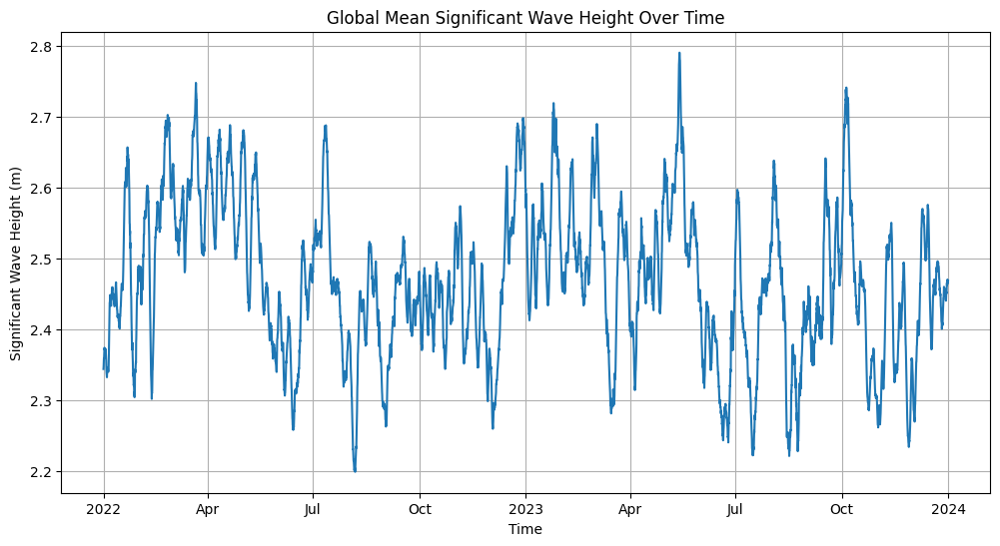

In [9]:
# Plot the global mean over time
plt.figure(figsize=(12, 6))
swh_global_mean.plot()
plt.title('Global Mean Significant Wave Height Over Time')
plt.xlabel('Time')
plt.ylabel('Significant Wave Height (m)')
plt.grid(True)
plt.show()

### 3.2 Plot Spatial Map for a Specific Time
* To visualize the spatial distribution of swh at a particular time:

In [10]:
# Select a specific time
specific_time = '2022-01-01T00:00:00'
swh_at_time = ds['swh'].sel(valid_time=specific_time)

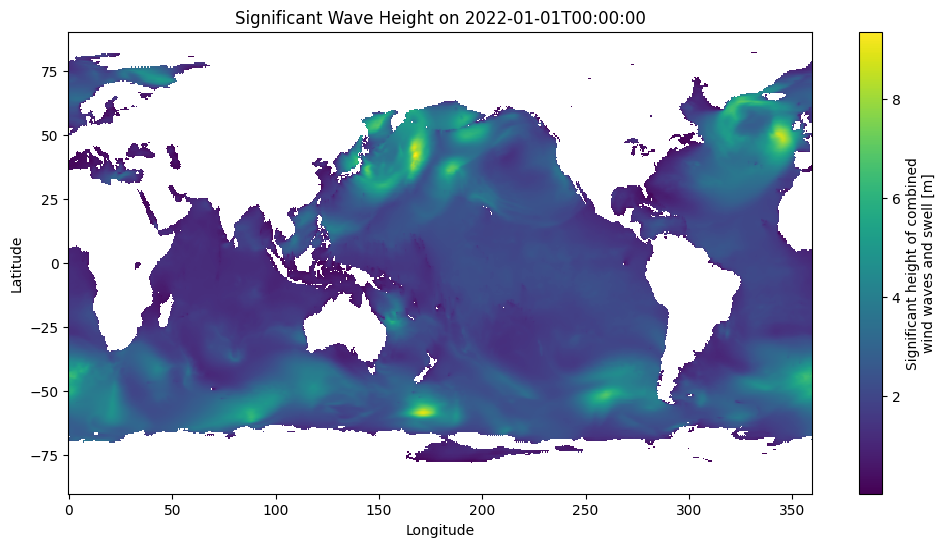

In [13]:
# Plot spatial map
plt.figure(figsize=(12, 6))
plot = swh_at_time.plot(cmap='viridis', add_colorbar=True)  # Ensure `add_colorbar=True` is used
plt.title(f'Significant Wave Height on {specific_time}')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.show()

### 3.3  Animation of Spatial Data Over Time
* create an animation to show the evolution of swh over time for 50 time steps

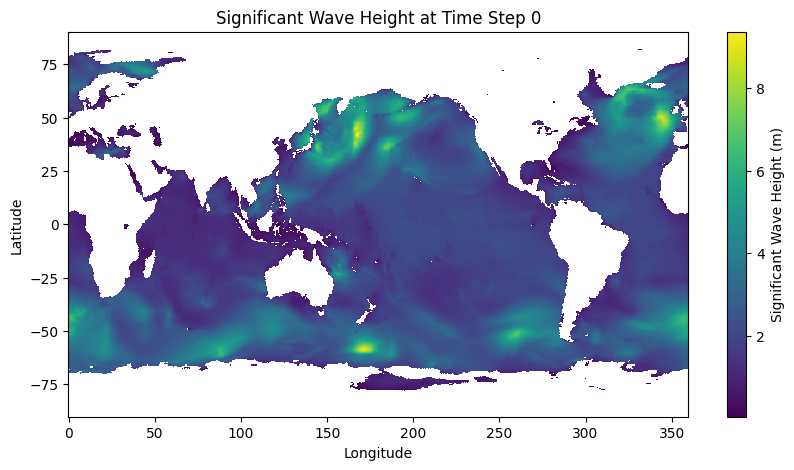

In [15]:
# Prepare figure
fig, ax = plt.subplots(figsize=(10, 5))
swh_plot = ds['swh'].isel(valid_time=0).plot(ax=ax, cmap='viridis', add_colorbar=False)
cbar = fig.colorbar(swh_plot, ax=ax)
cbar.set_label('Significant Wave Height (m)')

def update(frame):
    ax.clear()
    ds['swh'].isel(valid_time=frame).plot(ax=ax, cmap='viridis', add_colorbar=False)
    ax.set_title(f"Significant Wave Height at Time Step {frame}")
    ax.set_xlabel("Longitude")
    ax.set_ylabel("Latitude")

ani = animation.FuncAnimation(fig, update, frames=50, interval=200)  # Adjust frames and interval

HTML(ani.to_jshtml())

### 3.4 Saving Animation as a GIF

In [16]:
# Save the animation as a GIF
ani.save('/content/drive/MyDrive/Project Learnings/animation.gif', writer='imagemagick', fps=10)